# CaloChallenge 2022 - Dataset Loading and Usage

In [1]:
# imports
from HighLevelFeatures import HighLevelFeatures as HLF
import numpy as np
import h5py

All 3 datasets have a similar structure and the helper functions are designed to work on all of them. Below are a few examples on how to load and access the data, compute and plot high-level features, and look at average/individual showers for each dataset. 

## Dataset 1

In [2]:
# creating instance of HighLevelFeatures class to handle geometry based on binning file
HLF_1_photons = HLF('photon', filename='binning_dataset_1_photons.xml')
HLF_1_pions = HLF('pion', filename='binning_dataset_1_pions.xml')

In [3]:
# loading the .hdf5 datasets
photon_file = h5py.File('../dataset_1_photons.hdf5', 'r')
pion_file = h5py.File('../dataset_1_pions.hdf5', 'r')

In [4]:
# each file contains one dataset for each energy. They are named 'data_ENERGY' with ENERGY in MeV
for dataset in photon_file:
    # name of the datasets:
    print("dataset name: ", dataset)
    
    # energy can be extracted from the dataset name
    energy = float(dataset[5:])
    print("Energy of dataset: ", energy)

dataset name:  data_1024
Energy of dataset:  1024.0
dataset name:  data_1048576
Energy of dataset:  1048576.0
dataset name:  data_131072
Energy of dataset:  131072.0
dataset name:  data_16384
Energy of dataset:  16384.0
dataset name:  data_2048
Energy of dataset:  2048.0
dataset name:  data_2097152
Energy of dataset:  2097152.0
dataset name:  data_256
Energy of dataset:  256.0
dataset name:  data_262144
Energy of dataset:  262144.0
dataset name:  data_32768
Energy of dataset:  32768.0
dataset name:  data_4096
Energy of dataset:  4096.0
dataset name:  data_4194304
Energy of dataset:  4194304.0
dataset name:  data_512
Energy of dataset:  512.0
dataset name:  data_524288
Energy of dataset:  524288.0
dataset name:  data_65536
Energy of dataset:  65536.0
dataset name:  data_8192
Energy of dataset:  8192.0


In [5]:
# High-level features are computed once for a given dataset by calling EvaluateFeatures(data)
HLF_1_photons.EvaluateFeatures(photon_file["data_256"][:])
HLF_1_pions.EvaluateFeatures(pion_file["data_1024"][:])

# and can then be given out like this:

# total deposited energy in the shower
print("Total energy of each photon shower: ", HLF_1_photons.GetEtot())
print("Average total energy of the pion showers: ", HLF_1_pions.GetEtot().mean())

# energy deposited in each layer of the geometry:
# (returns a dict with layer_number as key. Note that the ATLAS geometry has fewer relevant layer than are totally
# available, the 5th layer of the photons therefore has layer_number 12)
print("Energy deposited in each layer for each photon shower: ", HLF_1_photons.GetElayers())
print("Average energy deposited in the first layer for pion showers: ", HLF_1_pions.GetElayers()[0].mean())
print("Average energy deposited in the last layer for pion showers: ", HLF_1_pions.GetElayers()[14].mean())


# Center of energy in eta direction:
# (only available for layer with more than one alpha bin)
print("Center of energy in eta direction for each photon shower: ", HLF_1_photons.GetECEtas())
# and its width
print("Width of center of energy in eta direction for each photon shower: ", HLF_1_photons.GetWidthEtas())

# Center of energy in phi direction:
# (only available for layer with more than one alpha bin)
print("Center of energy in phi direction for each pion shower: ", HLF_1_pions.GetECPhis())
# and its width
print("Width of center of energy in phi direction for each pion shower: ", HLF_1_pions.GetWidthEtas())


Total energy of each photon shower:  [274.94835483 167.71727273 267.14206318 ... 352.214468   264.28351909
 260.57444853]
Average total energy of the pion showers:  655.0220936945566
Energy deposited in each layer for each photon shower:  {0: array([ 92.23048 ,  41.692597,  53.60429 , ..., 248.721711,  42.939299,
         0.      ]), 1: array([146.1964963 ,  87.28812073,  82.73920918, ...,  53.253159  ,
       205.16882409, 174.59717653]), 2: array([ 36.52137853,  38.736555  , 130.798564  , ...,  50.239598  ,
        16.175396  ,  85.977272  ]), 3: array([0., 0., 0., ..., 0., 0., 0.]), 12: array([0., 0., 0., ..., 0., 0., 0.])}
Average energy deposited in the first layer for pion showers:  94.84633457615169
Average energy deposited in the last layer for pion showers:  0.29846660162
Center of energy in eta direction for each photon shower:  {1: array([ 2.62863337,  9.67196455, 19.74353388, ..., -5.24059168,
        7.82412738, -3.77330865]), 2: array([  4.08267633,  24.97615618,  16.3625

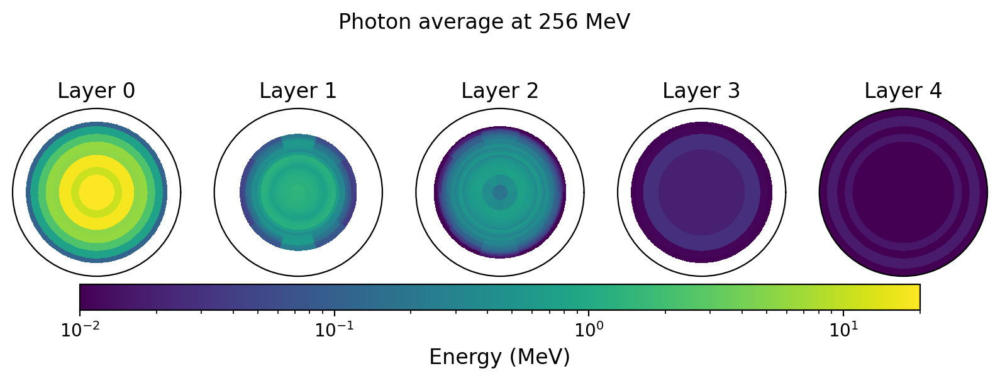

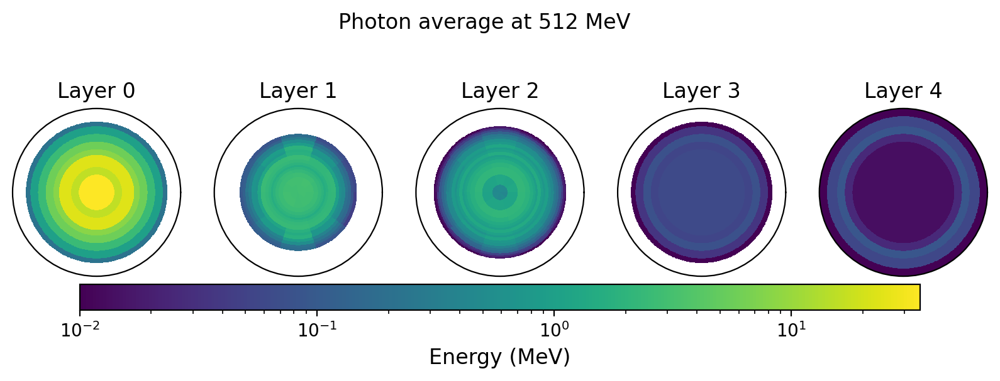

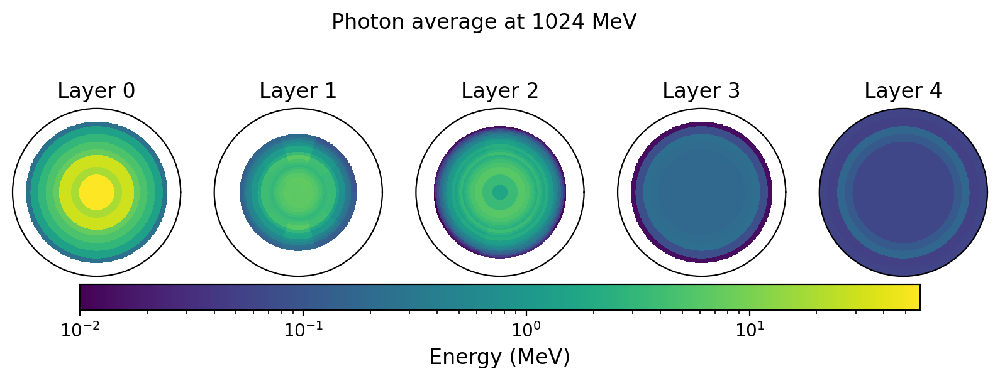

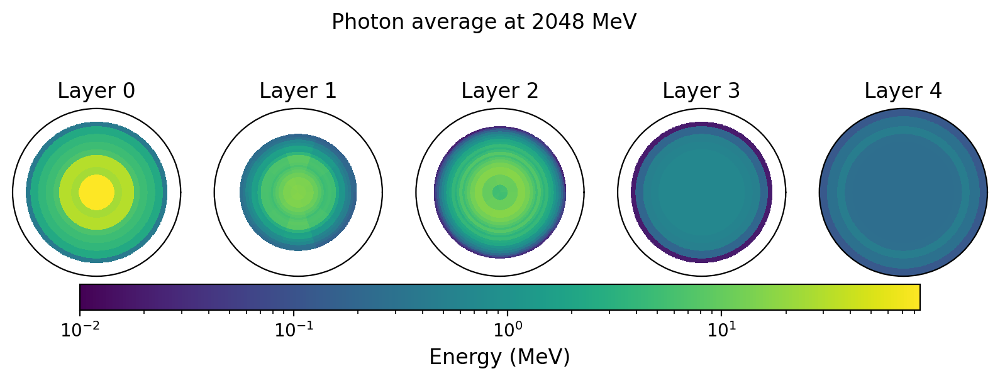

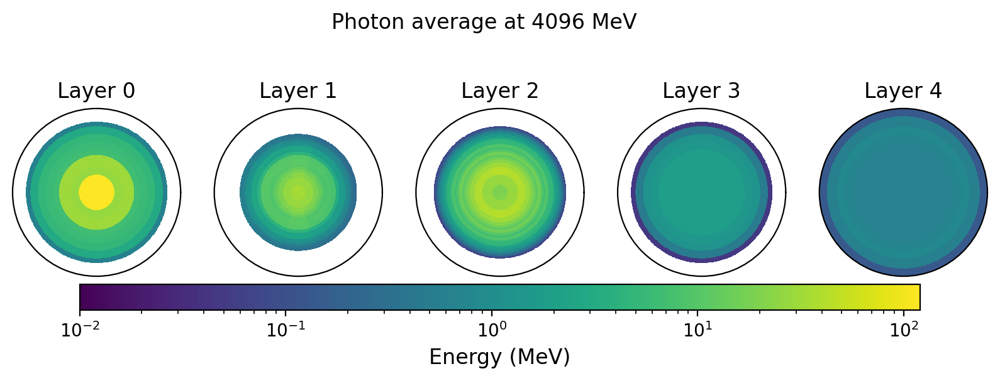

...

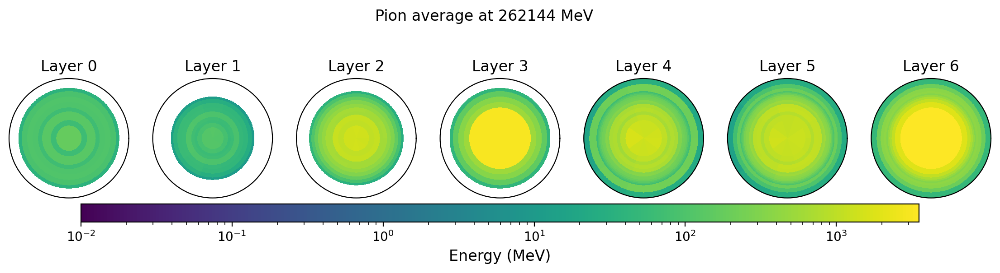

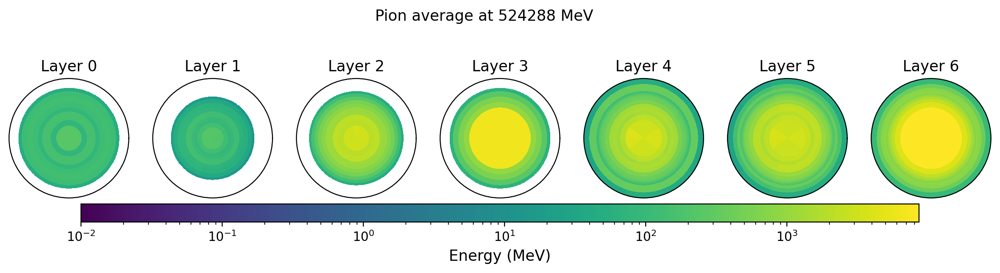

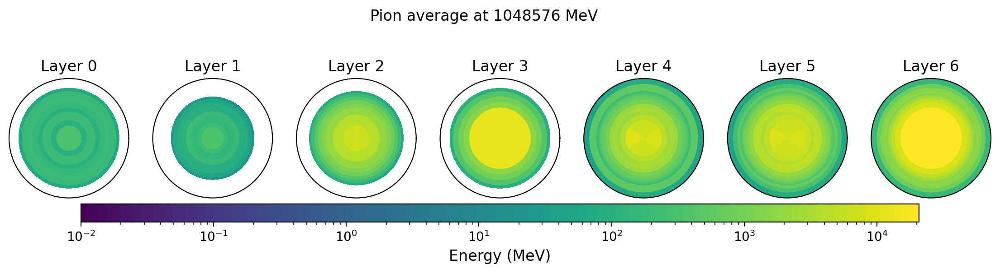

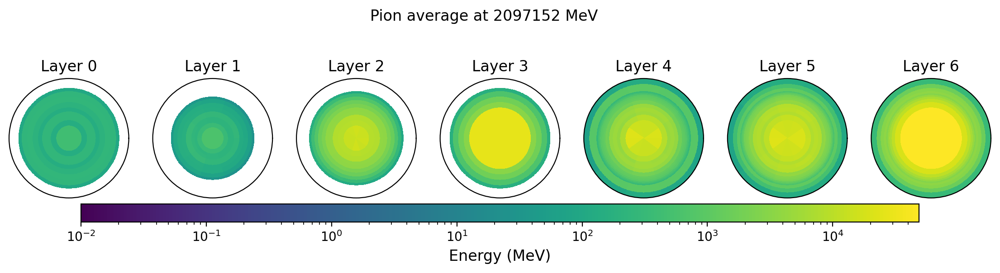

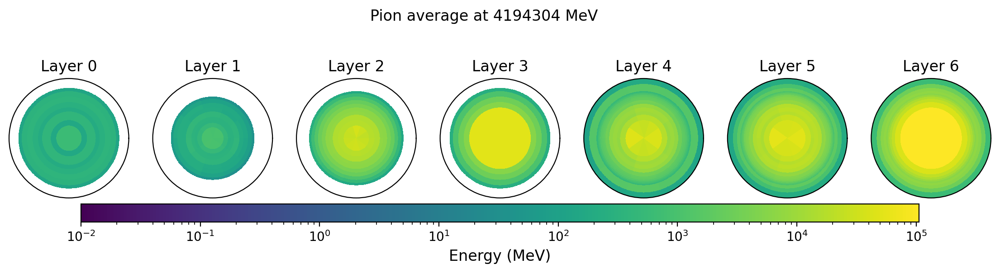

In [6]:
# looking at the average shower at each energy:
# not providing a filename or passing 'None' does not save the plot
# functions return instance of matplotlib.pyplot.figure
for n in range(8, 23):
    energy = 2**n
    _ = HLF_1_photons.DrawAverageShower(photon_file["data_"+str(energy)][:], filename=None, 
                                        title="Photon average at {} MeV".format(energy))
for n in range(8, 23):
    energy = 2**n
    _ = HLF_1_pions.DrawAverageShower(pion_file["data_"+str(energy)][:],
                                      title="Pion average at {} MeV".format(energy))


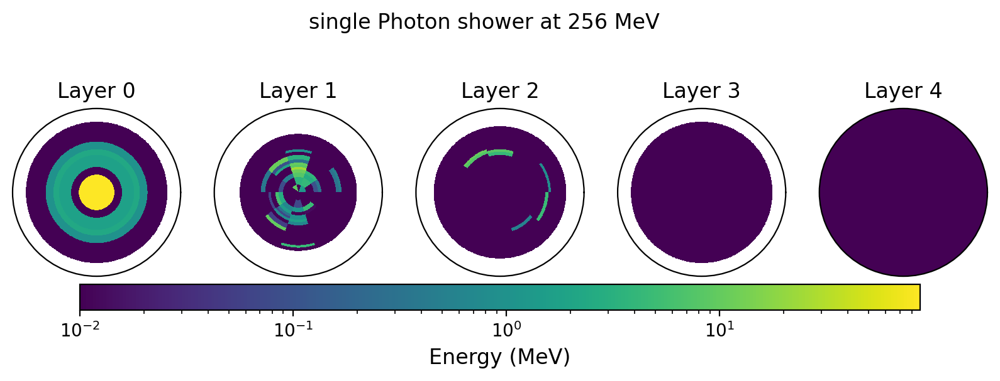

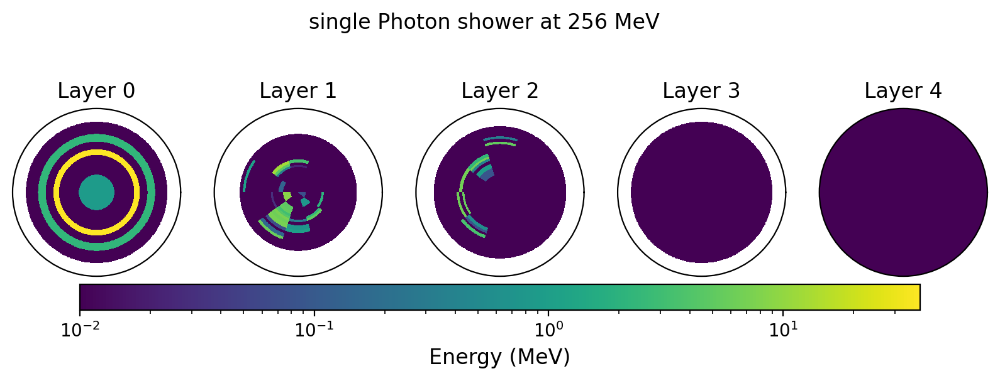

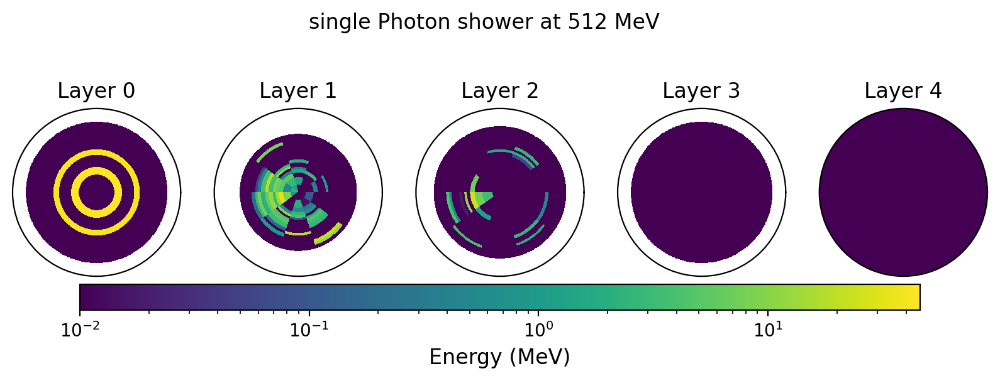

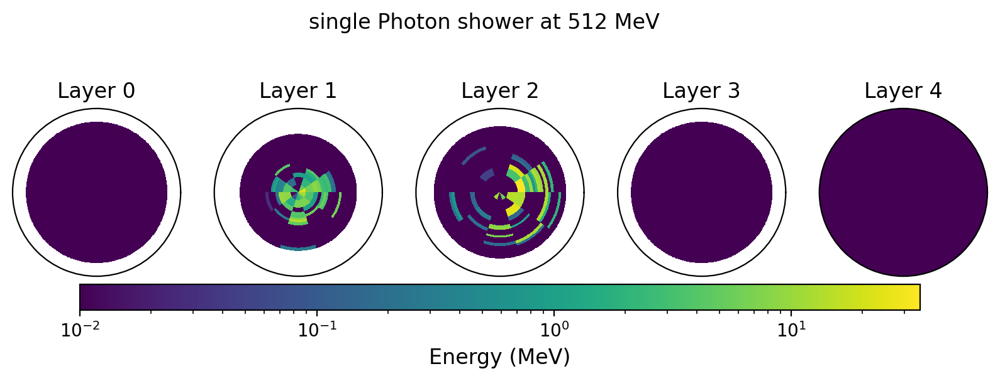

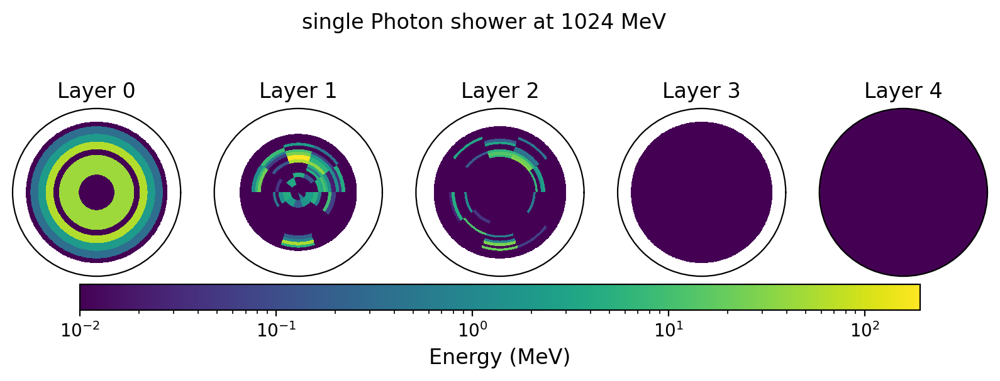

...

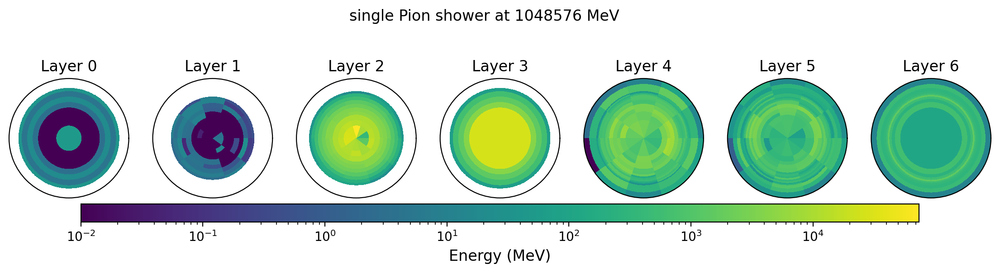

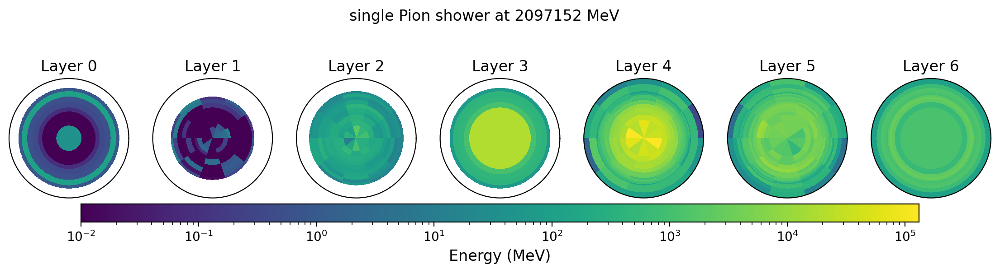

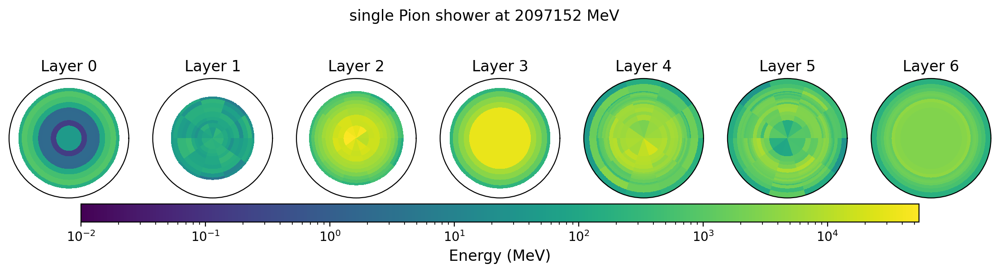

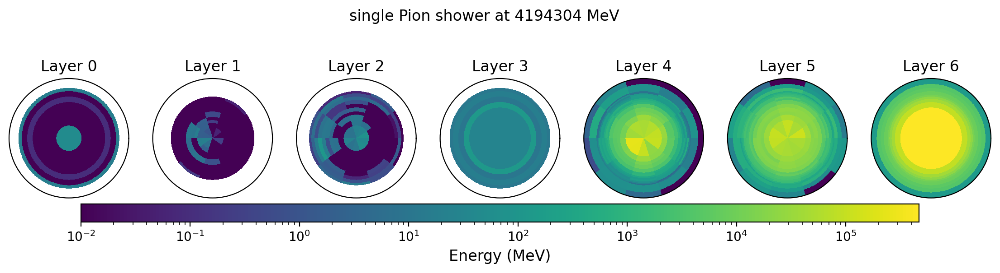

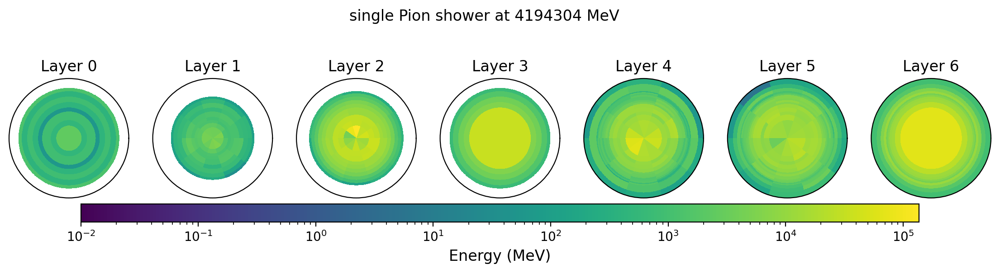

In [7]:
# looking at the first 2 showers at each energy:
# not providing a filename or passing 'None' does not save the plot
# functions return instance of matplotlib.pyplot.figure
for n in range(8, 23):
    energy = 2**n
    _ = HLF_1_photons.DrawSingleShower(photon_file["data_"+str(energy)][:2], filename=None, 
                                        title="single Photon shower at {} MeV".format(energy))
for n in range(8, 23):
    energy = 2**n
    _ = HLF_1_pions.DrawSingleShower(pion_file["data_"+str(energy)][:2],
                                     title="single Pion shower at {} MeV".format(energy))


## Dataset 2

In [8]:
# creating instance of HighLevelFeatures class to handle geometry based on binning file
HLF_2 = HLF('electron', filename='binning_dataset_2.xml')

In [9]:
# loading the .hdf5 dataset
electron_file = h5py.File('../dataset_2.hdf5', 'r')

In [10]:
# Coming soon!

## Dataset 3

In [11]:
# creating instance of HighLevelFeatures class to handle geometry based on binning file
HLF_3 = HLF('electron', filename='binning_dataset_3.xml')

In [12]:
# loading the .hdf5 datasets 
# (other files are dataset_3_50.hdf5, dataset_3_60.hdf5, dataset_3_70.hdf5, dataset_3_80.hdf5)
electron_file = h5py.File('../dataset_3_90.hdf5', 'r')

In [13]:
# Coming soon !